In [1]:
import numpy as np # library for data structures, vectors, matrices and mathematical functions
import matplotlib.pyplot as plt                   # library for plotting and visual representation
import matplotlib.transforms as transform                   # library for plotting and visual representation
from matplotlib import rcParams                   # module handling generic plot parameters
from matplotlib.ticker import (FormatStrFormatter)# module for figure axis formatting
import pandas as pd                               # data administration, here used for data import
from scipy.optimize import curve_fit              # fitting algorithm from the scipy package
from IPython.display import display as dy, Markdown as md, Latex as Lx, Image as Im, HTML as hm # displaying LaTeX code in code cells
import os
import re
from scipy.signal import find_peaks

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams.update({'font.size': 12,
                     'axes.titlesize': 18,
                     'axes.labelsize': 16,
                     'axes.labelpad': 14,
                     'lines.linewidth': 1,
                     'lines.markersize': 15,
                     'xtick.labelsize' : 16,
                     'ytick.labelsize' : 16,
                     'xtick.top' : True,
                     'xtick.direction' : 'in',
                     'ytick.right' : True,
                     'ytick.direction' : 'in',
                     'figure.figsize': (10,6),
                    })

plt.rcParams['axes.facecolor'] = 'black' 
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['axes.titlecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'black'
plt.rcParams['xtick.labelcolor'] = 'white'
plt.rcParams['ytick.labelcolor'] = 'white'
plt.rcParams['legend.labelcolor'] = 'white'
plt.rcParams['grid.color'] = '#707070'
plt.rcParams['axes.titlepad'] = 20
legendfontsize=12

ip = get_ipython()
ibe = ip.configurables[-1]
ibe.figure_formats = { 'pdf', 'png'}

#  O04e Focal Length and Principal Planes of a Lens System

Group #13

NG Kuok Fung | #3797903 

Edgar Harutyunyan | #3775171

**Overview of Tasks**

1. Determine the focal length and the position of the principal planes of a system consisting of two thin converging lenses for a given lens distance.


2. Determine the focal lengths of both lenses using Bessel’s method. Measure the distance between the lenses and calculate the focal length of the lens system.


3. Draw a diagram to scale showing the positions of the principal planes and the focal points of the lens system; construct an image corresponding to one measured object distances from task 1. Determine the value of the linear magnification from the construction and compare to the experimental value. 

## Task 1

***Task Definition*** 

Determine the focal length of the system of 2 lenses $f_{sys}$ and the position of the principal planes $h$ and $h'$ of a system consisting of two thin converging lenses for a given lens distance.

***Theoretical Basis*** 

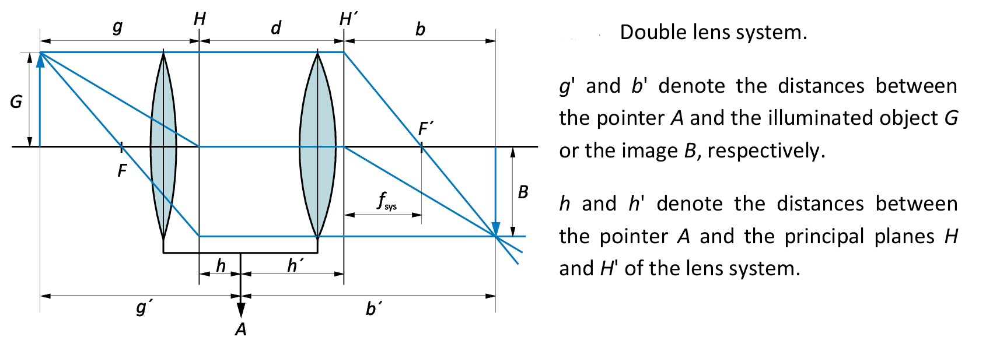

<IPython.core.display.Latex object>

In [2]:
dy(Im("./img/Fig1.2.jpg", height=100, width=700))
dy(Lx(r'$Figure\, 1.1$: Double Lens System Diagram'))

***Theoretical Basis***

**Linear Magnification $\gamma$**

During the experiment, the following sign convention is used to measure object $G$ and image $B$ sizes **Fig 1.1**.

- Object sizes ($G$) are positive because it lies above the principal axis. 

- Image sizes ($B$) are negative because the image is inverted and lies beneath the principal axis.

The linear magnification is given by: $$ \gamma = \frac{B}{G} \label{eq1.1} \tag{1.1}$$

**Principal planes $h$ and $h'$**

Note: During the experiment, only the absolute value of the distances were measured.

The magnitude of $h$ and $h'$ provides the distance between the pointer $A$ and the principal planes $H$ and $H'$ respectively. 

The sign of $h$ and $h'$ indicates whether the principal planes lies to the right or left of pointer $A$.

With reference to Fig 1.1, note the following:

If $h' = b' - b$ is negative, then $b' < b$ $\implies$ Principal plane $H'$ lies to the left of pointer $A$.

If $h = g' - g$ is positive, then $g' > g$  $\implies$ Principal plane $H$ lies to the left of pointer $A$.

- $b'$ : Image distance 
- $g'$ : Object distance


The Fitting Functions are given as follows: 

$$g' = g + h = f_{sys} \left(1 + \frac{1}{\gamma} \right) + h \label{eq1.2} \tag{1.2}$$

$$b' = b + h' = f_{sys} (1 + \gamma) + h'\label{eq1.3} \tag{1.3}$$

***Procedure*** 

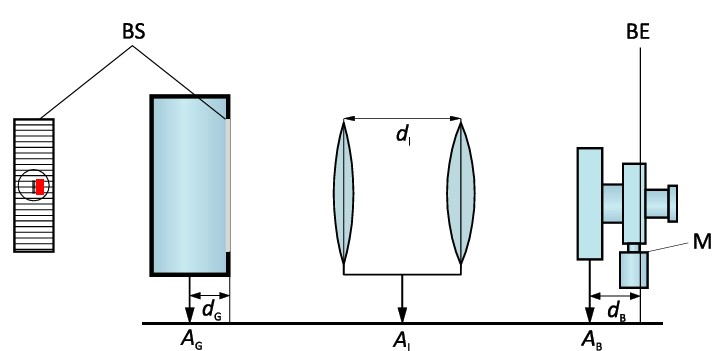

<IPython.core.display.Latex object>

In [3]:
dy(Im("./img/Fig1.1.jpg", height=100, width=500))
dy(Lx(r'$Figure\, 1.2$: Double Lens System Experimental Setup'))

1. A double-lens system is picked with a fixed lens distance $d_l$, and correction values $d_B$ and $d_G$  (**Fig 1.2**).
<br>

2. Adjust the lens system until a sharp image forms, then measure the object size ($G$) and the image size ($B$) using the micrometer labeled M in **Fig 1.2**.
<br> 

3. Measure the distances $d_1$ and $d_2$ between pointers $A_G$ and $A_l$ and between $A_B$ and $A_l$, respectively.
<br>

4. Calculate the object $g'$ and image $b'$ distances using the following formulas:
- $g'$ = $|d_1| - d_G$
- $b'$ = $|d_2| + d_B$
<br> 

5. Calculate the linear magnification $\gamma$ using Eq [1.1](#mjx-eqn-eq1.1).
</br>

6. Repeat the procedure for 10 different values of $g'$ and $b'$.
</br> 

7. Perform linear regression using Eq [1.2](#mjx-eqn-eq1.1) and Eq [1.3](#mjx-eqn-eq1.1), and find the values of $f_{sys}$, $h$ and $h'$ from the fit.

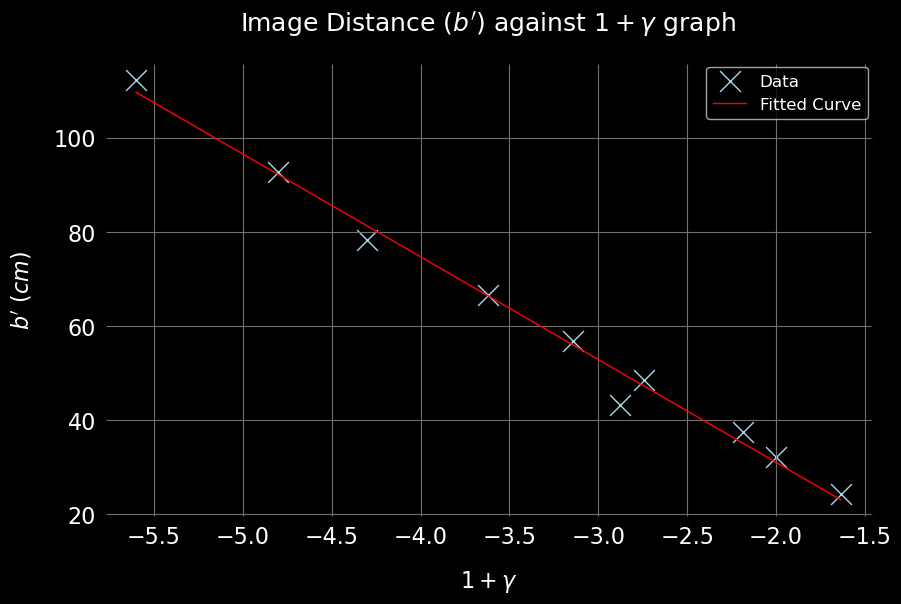

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

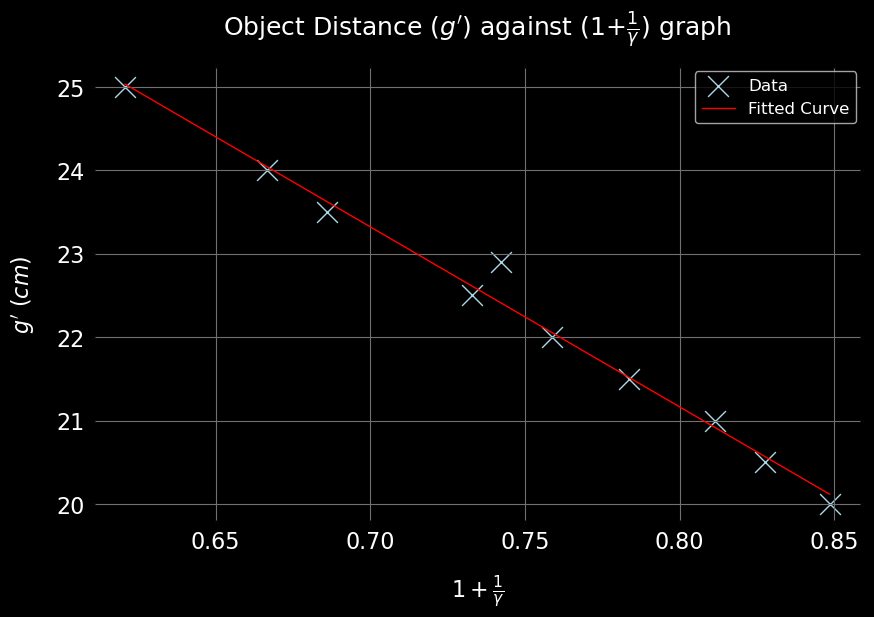

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [4]:
# Load the Excel file
file_path = "./data/O04e.xlsx"
df = pd.read_excel(file_path, 'task1')

# Extract and rename columns
df1 = df.iloc[0:10, [4, 12]].rename(columns={df.columns[4]: 'y1', df.columns[12]: 'x1'})
df2 = df.iloc[0:10, [5, 13]].rename(columns={df.columns[5]: 'y2', df.columns[13]: 'x2'})
df1['y1'] = df1['y1']*1e-1 # mm -> cm
df2['y2'] = df2['y2']*1e-1 # mm -> cm
# Define a function to create scatter plots with non-linear regression and label renaming
def fit_and_plot(df, x_col, y_col, xlabel, ylabel, title, fit_func):
    plt.scatter(df[x_col], df[y_col], color='#ADD8E6',marker='x', label=r'Data')
    #plt.scatter(df[x_col], df[y_col], color=color,marker='x', label=f'{ylabel[:-4]} vs {xlabel}')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    
    # Perform non-linear regression using curve_fit
    x = df[x_col].values
    y = df[y_col].values
    params, cov_mat = curve_fit(fit_func, x, y)
    
    # Plot the fitted curve
    x_fit = np.linspace(min(x), max(x), 100)
    y_fit = fit_func(x_fit, *params)
    plt.plot(x_fit, y_fit, color='red', label='Fitted Curve')
    plt.legend()
    plt.show()
    return [params, cov_mat]

# Define a linear function for curve fitting
def f(x, f_arg, h_arg):
    return f_arg*x+h_arg

## Plot b against x2 with non-linear regression and custom labels
fit_1 = fit_and_plot(df2, 'x2', 'y2', r'$1+\gamma$', r"$b'$ ($cm$)", "Image Distance ($b'$) against $1+\gamma$ graph", f)
dy(Lx(r"$Figure\, 1.1$: Image Distance ($b'$) against $1+\gamma$ fit."))
dy(Lx(r"$$|f_{sys}| = (%.2f \pm %.3f) ~cm$$" % (np.abs(fit_1[0][0]), np.sqrt(fit_1[1][0][0]))))
dy(Lx(r"$$h' = (%.2f \pm %.3f) ~cm$$" % (fit_1[0][1], np.sqrt(fit_1[1][1][1]))))
## Plot g against x1 with non-linear regression and custom labels
fit_2 = fit_and_plot(df1, 'x1', 'y1', r'$1+\frac{1}{\gamma}$', "$g'$ ($cm$)", r"Object Distance ($g'$) against (1+$\frac{1}{\gamma}$) graph", f)
dy(Lx(r"$Figure\, 1.2$: Object Distance ($g'$) against (1+$\frac{1}{\gamma}$) graph fit."))
dy(Lx(r"$$|f_{sys}| = (%.2f \pm %.3f) ~cm$$" % (np.abs(fit_2[0][0]), np.sqrt(fit_2[1][0][0]))))
dy(Lx(r"$$h = (%.2f \pm %.3f) ~cm$$" % (fit_2[0][1], np.sqrt(fit_2[1][1][1]))))

## Task 2

***Task Definition*** 

Determine the focal lengths of both lenses $f_1$ and $f_2$ using Bessel’s method. Measure the distance ($a$) between the lenses and calculate the focal length $f_{sys}$ of the double-lens system from task 1.

***Theoretical Basis*** 

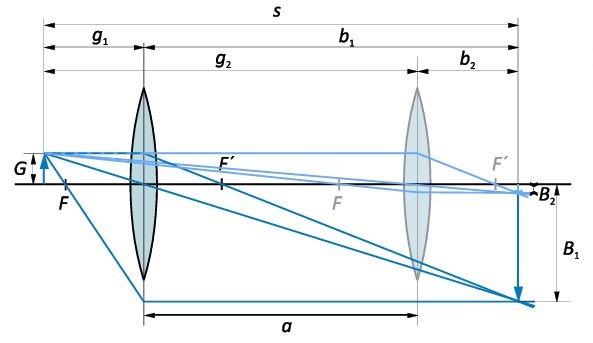

<IPython.core.display.Latex object>

In [5]:
dy(Im("./img/Bessel.jpg", height=100, width=600))
dy(Lx(r'$Figure\, 2.1$: Bessel Method Setup'))

The Lens Equation: $$\frac{1}{f}=\frac{1}{b}+\frac{1}{g}$$

- $f$ : Focal Length of Lens 
- $b$ : Image Distance
- $g$ : Object Distance

From Fig 2.1: $$s=b+g$$

By Substitution: $$\frac{1}{f}=\frac{s}{g(s-g)}$$

This yields: $$ 0 = g^2-sg+sf $$

Solving for $g$: $$ g_{1,2} =\frac{s}{2} \pm \sqrt{\frac{s^2}{4}-sf}$$

Hence: $$ g_1 - g_2 = \sqrt{s^2-4sf} $$

It is observed that: $$a= g_1-g_2 \label{eq2.1} \tag{2.1}$$

Therefore: $$ f= \frac{s^2-a^2}{4s}\label{eq2.2} \tag{2.2}$$


Additionally, the focal length $f_{sys}$ of a double-lens system is given by: 

$$\frac{1}{f_{sys}}=\frac{1}{f_1}+\frac{1}{f_2}-\frac{d_l}{f_1f_2} \label{eq2.3} \tag{2.3}$$

- $f_1$ : Focal length of first lens
- $f_2$ : Focal length of second lens
- $d_l$ : Distance between lenses

***Procedure*** 

1. The distance ($S$) between the object ($G$) and the screen ($B$) is measured and kept constant during the experiment. A lens from Task1 with focal length $f_1$ is then placed in-between the object and screen **Fig 2.1**.
<br>

2. The lens is adjusted until a sharp image forms on the screen, at which point the object distance ($g_1$) and the image distance ($b_1$) are recorded.
<br>

3. The lens is moved again until another sharp image forms, and the new distances ($g_2$) and ($b_2$) are recorded.
<br>

4. The distance ($a$) between the two different lens positions is found using Eq [2.1](#mjx-eqn-eq2.1), and $f_1$ is determined using Eq [2.2](#mjx-eqn-eq2.2).
<br>

5. The previous steps are repeated for 5 different values of ($s$), and the average value of ($f_1$) is determined.
<br>

6. This procedure is repeated using the second lens from Task1 with focal length ($f_2$). 
<br>

7. The theoretical focal length $f_{sys}$ of the double-lens system is determined using Eq [2.3](#mjx-eqn-eq2.2).

***Measurements*** 

**Lens 1**

| # | $S$ ($mm$) | $g_1$ ($mm$) | $b_1$ ($mm$) | $g_2$ ($mm$) | $b_2$ ($mm$) | $a$ ($mm$) | $f_1$ ($mm$) |
| --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | 650.0 | 98.0 | 552.0 | 545.0 | 105.0 | 447.0 | 85.65 |
| 2 | 750.0 | 96.0 | 654.0 | 647.0 | 103.0 | 551.0 | 86.30 |
| 3 | 850.0 | 94.0 | 756.0 | 749.0 | 101.0 | 655.0 | 86.32 |
| 4 | 550.0 | 102.0 | 448.0 | 441.0 | 109.0 | 339.0 | 85.26 |
| 5 | 450.0 | 110.0 | 340.0 | 330.0 | 120.0 | 220.0 | 85.61 |


Average value of $f_1 = 85.83 ~mm$

**Lens 2**

| # | $S$ ($mm$) | $g_1$ ($mm$) | $b_1$ ($mm$) | $g_2$ ($mm$) | $b_2$ ($mm$) | $a$ ($mm$) | $f_2$ ($mm$) |
| --- | --- | --- | --- | --- | --- | --- | --- |
| 1 | 1290.0 | 525.0 | 765.0 | 790.0 | 500.0 | 265.0 | 308.89 |
| 2 | 1390.0 | 446.0 | 944.0 | 940.0 | 450.0 | 494.0 | 303.61 |
| 3 | 1490.0 | 430.0 | 1060.0 | 1059.0 | 431.0 | 629.0 | 306.12 |
| 4 | 1590.0 | 427.0 | 1163.0 | 1176.0 | 414.0 | 749.0 | 309.29 |
| 5 | 1690.0 | 404.0 | 1286.0 | 1288.0 | 402.0 | 884.0 | 306.90 |

Average value of $f_2 = 306.96 ~mm$

During the experiment: $$d_l = 272 ~mm$$ 

Therefore: $$  f_{sys} = 218.11 ~mm = 21.81 ~cm$$

***Analysis*** 

It is observed that Bessel’s method yields approximately the same value for $f_{sys}$ as found in task 1.


## Task 3

***Task Definition*** 

Draw a diagram to scale showing the positions of the principal planes and the focal points of the lens system; construct an image corresponding to one measured object distances from task 1. Determine the value of the linear magnification from the construction and compare to the experimental value. 

***Procedure*** 

1. A scale diagram has been drawn using values determined from tasks 1 and 2.
<br>

2. The following conditions were considred when constructing the scale diagram:

- Object distance: $g' = 250 ~mm$
- Principal planes $H$ and $H'$, which are considered as ideal thin convex lenses, are placed at positions $h$ and $h'$ respectively. 
- Focal Lengths $f_1$ and $f_2$ of each lens taken from Task 2.
<br>

3. The scale diagram was used to find the image size $B$ of an arbitrary object with object size $G$.
<br>

4. Subsequently, the theoretical linear magnification $\gamma_{theory}$ was evaluated using Eq [1.1](#mjx-eqn-eq1.1), and compared to the actual value of $\gamma$ corresponding to $g' = 250 ~mm$ from task 1.

In [6]:
diagram = Im("./img/task3.jpg")
dy(diagram)
#dy(diagram.resize(( int(diagram.width * scale), int(diagram.height * scale))))
dy(Lx(r"$Figure\, 3.1$: Diagram of the lens system for $g' =250 ~mm$ measurement value."))

<IPython.core.display.Latex object>

***Analysis*** 

From the **Fig.3.1**:

$$\gamma_{theory} = \frac{B}{G} = \frac{158.42 ~mm}{55.22 ~mm} = 2.87$$

From task 1: 

$$\gamma_{actual} = 2.64$$

Hence, it is observed that the theoretical and actual value of $\gamma$ are approximately equal as expected.

The slight difference between the values is likely due to not having considered the radius of curvature and the thickness of the lenses when evaluating $\gamma_{theory}$.